Import Package dan Module

In [1]:
import pandas as pd
import numpy as np
import struct
import joblib
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import tensorflow as tf
from tensorflow import keras
from keras import regularizers
import matplotlib.pyplot as plt
import seaborn as sns

1. Memuat Dataset

In [2]:
# Load the training dataset
data = pd.read_csv('Ransomware_headers.csv', header=0)
df = pd.DataFrame(data)
df

,ID,filename,GR,family,0,1,2,3,4,5,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,10000,2XClient_12.0_build_2193.paf.exe,0,0,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0
1,10001,7-ZipPortable_21.07.paf.exe,0,0,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0
2,10002,ARP.EXE,0,0,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0
3,10003,AccountsControlHost.exe,0,0,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0
4,10004,ActionUriServer.exe,0,0,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,21018,ece7ddff2ff9fdb8e7f55b674baa9c975ce86ff79e02db...,1,25,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0
2153,21019,f247ae6db52989c9a598c3c7fbc1ae2db54f5c65be8628...,1,25,77,90,80,0,2,0,...,0,0,0,0,0,0,0,0,0,0
2154,21020,f38c40c74a0a9953697c63fbd375c064cb2d59ce478435...,1,25,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0
2155,21021,fa789f56ef3f5075fc02c53cd937fe1580ae46217cf0a8...,1,25,77,90,144,0,3,0,...,0,0,0,0,0,0,0,0,0,0


2. Pra-Pemrosesan Data

In [3]:
X = df.drop(['ID','filename', 'family','GR'], axis=1)
y = df['GR']

In [15]:
print(X.to_string())

       0   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16   17   18   19  20   21   22   23   24   25   26   27   28   29  30   31   32  33   34  35   36   37   38   39   40   41   42   43   44   45   46   47   48   49   50   51   52   53   54   55   56   57   58   59   60  61  62  63   64   65   66   67  68   69   70   71   72   73   74   75   76   77   78   79   80   81   82   83   84   85   86   87   88   89   90   91   92   93   94   95   96   97   98   99  100  101  102  103  104  105  106  107  108  109  110  111  112  113  114  115  116  117  118  119  120  121  122  123  124  125  126  127  128  129  130  131  132  133  134  135  136  137  138  139  140  141  142  143  144  145  146  147  148  149  150  151  152  153  154  155  156  157  158  159  160  161  162  163  164  165  166  167  168  169  170  171  172  173  174  175  176  177  178  179  180  181  182  183  184  185  186  187  188  189  190  191  192  193  194  195  196  197  198  199  200 

In [4]:
#Normalisasi
scaler = StandardScaler()
scaler2 = scaler.fit_transform(X)
X_scaled = scaler.fit_transform(X)

In [13]:
print(X_scaled.shape)

(2157, 1024)


In [5]:
#Dimensionality Reduction dengan PCA
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

In [6]:
joblib.dump(scaler,'scaler.pkl')
joblib.dump(pca,'pca.pkl')

['pca.pkl']

3. Seed untuk konsistensi hasil keras

In [6]:
# Set your desired seed value
import random
seed_value = 42

# 1. Seed everything
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
keras.utils.set_random_seed(seed_value)

4. Pembagian data uji dan latih

5. Pengujian Random Forest Only

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
rf_classifier = RandomForestClassifier(n_estimators=100, oob_score=True,random_state=42, max_depth=5)
rf_classifier.fit(X_train, y_train)

y_pred_rf = rf_classifier.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Random Forest Testing Accuracy:", accuracy_rf)

ya_pred_rf = rf_classifier.predict(X_train)
accuracy_train_rf = accuracy_score(y_train, ya_pred_rf)
print("Random Forest Training Accuracy:", accuracy_train_rf)

print(classification_report(y_test, y_pred_rf))
cm = confusion_matrix(y_test, y_pred_rf)

print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

train_sizes, train_scores, test_scores = learning_curve(rf_classifier, X, y, cv=10, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.show()

joblib.dump(rf_classifier, 'rf.pkl')

ValueError: Found input variables with inconsistent numbers of samples: [1, 2157]

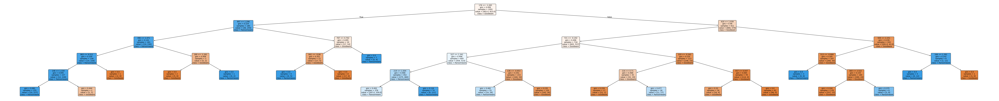

In [9]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

estimator = rf_classifier.estimators_[0] 

plt.figure(figsize=(100,10))  
plot_tree(estimator, 
          feature_names=X.columns,  
          class_names=['Goodware', 'Ransomware'], 
          filled=True, 
          rounded=True, 
          fontsize=10) 
plt.show()

In [15]:
with open('goodware/helper.exe', 'rb') as f:
    bytes_data = f.read(1024)

decimal_values = list(struct.unpack('B' * len(bytes_data), bytes_data))

X_new = np.array(decimal_values).reshape(1, -1)

X_scaled = scaler.transform(X_new) 
print(X_scaled)

predict_new = rf_classifier.predict(X_scaled)

print(predict_new)

[[ 0.          0.          0.15606652 ... -0.14603367 -0.13200915
  -0.19352849]]
[1]


d:\Code\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


6. Pengujian Random Forest dengan Top Features

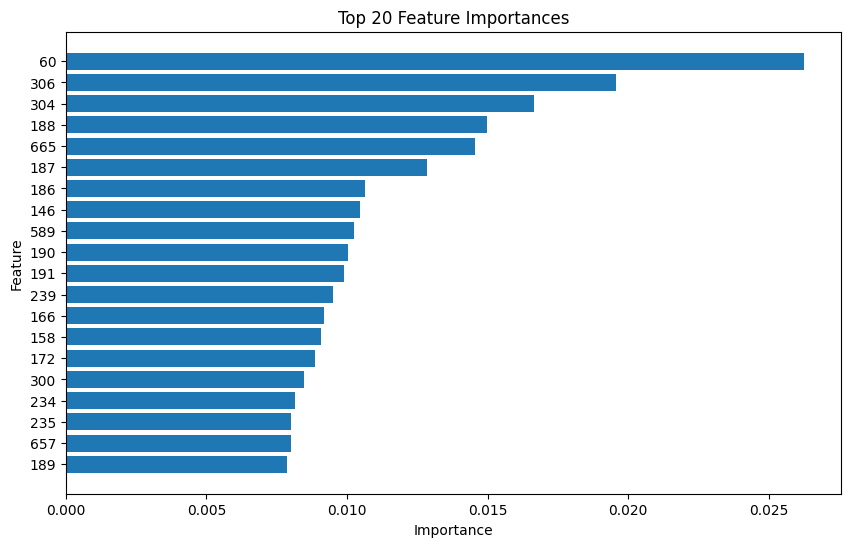

    Feature  Importance
60       60    0.026253
306     306    0.019575
304     304    0.016642
188     188    0.014972
665     665    0.014567
187     187    0.012861
186     186    0.010656
146     146    0.010469
589     589    0.010246
190     190    0.010016
191     191    0.009900
239     239    0.009504
166     166    0.009163
158     158    0.009086
172     172    0.008864
300     300    0.008455
234     234    0.008136
235     235    0.008013
657     657    0.007989
189     189    0.007865


In [11]:
rf_classifier_top_features = RandomForestClassifier(n_estimators=100, oob_score=True,random_state=42, max_depth=5)
rf_classifier_top_features.fit(X_train, y_train)

importances = rf_classifier_top_features.feature_importances_
feature_names = X.columns

feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

top_n = 20
top_features = feature_importances.head(top_n)
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title(f'Top {top_n} Feature Importances')
plt.gca().invert_yaxis()
plt.show()
print(top_features)

7. Pengujian Random Forest dengan PCA

In [10]:
np.set_printoptions(threshold=np.inf, linewidth=np.inf)
print(X_pca)

[[-1.69871458e+00  8.79242369e+00  6.10186642e+00 -3.74524801e+00  5.10677477e+00  7.67120630e+00 -2.26697669e+00  3.69102101e+00 -1.79587395e+00  1.73916431e+00  1.34744337e+00 -1.91686314e+00 -3.30297773e+00 -1.62141958e-01  1.13731430e+00 -6.57887221e+00  5.63960882e+00 -2.08512075e+00  2.22927584e+00 -2.77578721e+00  9.68354141e+00 -3.96504243e+00 -4.17647011e+00 -6.55890303e-02 -1.40408911e+00  3.04658758e+00 -9.67755342e-01  2.56475974e+00  4.11116351e+00  1.56973283e+00 -1.70420858e+00  1.51219547e-01 -9.73782000e-01 -1.74180788e-01 -1.05555625e+00 -4.47689626e-01  1.35771275e+00 -2.89877798e-01 -4.13227348e-01  1.55835903e+00  5.57301417e-01  1.92976279e+00 -1.26037059e+00 -1.56480968e+00 -1.56719183e+00  5.90863239e-01  1.85389307e-01 -2.11874638e+00  2.74270534e+00  4.36260797e-01 -7.48779747e-01  1.69896029e-01 -4.27251022e-01  6.58023731e-01  1.16779517e+00 -1.73092538e+00  9.61923331e-01 -8.72450911e-01  1.01919209e+00  1.04787416e+00 -5.46857077e-01 -1.68768553e+00  1.801

In [11]:
print(X_pca.shape)

(2157, 184)


Random Forest Accuracy: 0.9259259259259259
Random Forest Training Accuracy: 0.9681159420289855
              precision    recall  f1-score   support

           0       0.91      0.95      0.93       222
           1       0.95      0.90      0.92       210

    accuracy                           0.93       432
   macro avg       0.93      0.93      0.93       432
weighted avg       0.93      0.93      0.93       432

Confusion Matrix:
[[212  10]
 [ 22 188]]


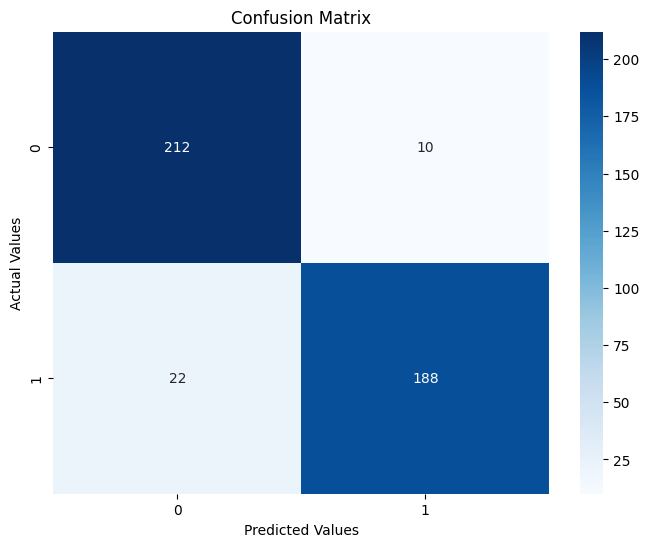

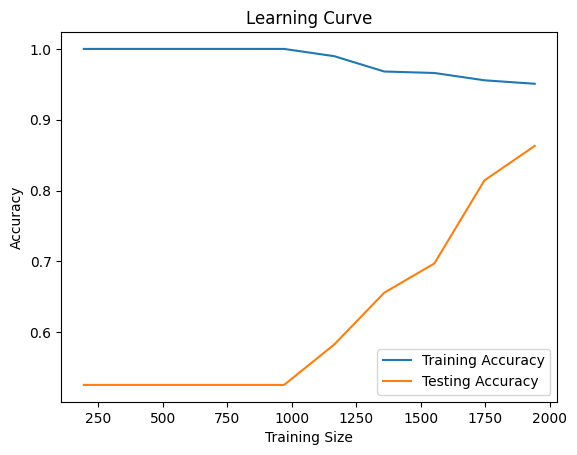

In [7]:

X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

rf_classifier_pca = RandomForestClassifier(n_estimators=100, oob_score=True,random_state=42, max_depth=5)
rf_classifier_pca.fit(X_train, y_train)

y_pred_rf = rf_classifier_pca.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Random Forest Accuracy:", accuracy_rf)

ya_pred_rf = rf_classifier_pca.predict(X_train)
accuracy_train_rf = accuracy_score(y_train, ya_pred_rf)
print("Random Forest Training Accuracy:", accuracy_train_rf)

print(classification_report(y_test, y_pred_rf))

cm = confusion_matrix(y_test, y_pred_rf)

print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

train_sizes, train_scores, test_scores = learning_curve(rf_classifier_pca, X, y, cv=10, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.show()

In [13]:
with open('BluetoothLogView.exe', 'rb') as f:
    bytes_data = f.read(1024)

decimal_values = list(struct.unpack('B' * len(bytes_data), bytes_data))

X_new = np.array(decimal_values).reshape(1, -1)

X_scaled_new = scaler.transform(X_new) 
print(X_scaled_new)
X_pca_new = pca.transform(X_scaled_new)
print(X_pca_new)
print(X_pca_new.shape)

predict_new = rf_classifier_pca.predict(X_pca_new)

print(predict_new)


[[ 0.          0.          0.15606652 ...  0.08553746 -0.13200915
   3.57834209]]
[[-7.30971149e-01 -1.37271669e-01  1.78482419e+00 -2.89263914e+00
   6.01053392e+00  2.78497570e+00 -7.24847530e-01 -1.70092107e+00
   4.38389803e-01 -3.74464586e+00 -3.74305016e+00 -2.04530649e-01
   3.26153574e+00 -9.74590758e-01  2.29792038e-01 -3.34424131e+00
   5.08717285e+00  1.50437476e+01  3.43111139e+00 -2.17543514e+00
  -1.32952049e+00  2.41314954e+00  1.84067240e+00 -2.83000379e+00
   3.93066734e+00  7.40432467e-01 -1.26828321e+00  6.53316354e-01
   3.97950626e-01  4.56838952e-01  9.95174437e-01 -5.95438030e-01
   1.08117005e+00  1.65972274e+00  1.16558712e+00  9.00197210e-02
   3.38476616e-01 -1.45621637e+00 -2.52669071e+00 -1.13575476e+00
   9.82735464e-01 -9.05281875e-01  1.34124478e+00 -2.99436772e-01
   5.69977674e-01 -3.25765992e-01  3.79713010e-01 -5.31720138e-02
  -3.94511174e-01 -4.41487379e-01  2.22895938e+00 -1.37048177e-01
   7.92281594e-01 -2.31254657e+00 -7.86999826e-01  1.2695396

d:\Code\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


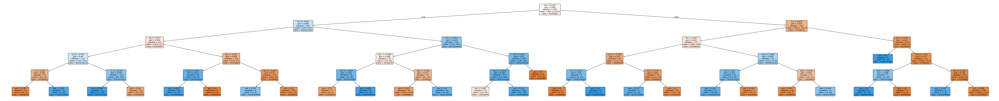

In [14]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

estimator = rf_classifier_pca.estimators_[0] 

plt.figure(figsize=(100,10))  
plot_tree(estimator, 
          feature_names=X.columns,  
          class_names=['Goodware', 'Ransomware'], 
          filled=True, 
          rounded=True, 
          fontsize=10) 
plt.show()

In [15]:
joblib.dump(rf_classifier_pca, 'rf_pca.pkl')

['rf_pca.pkl']

8. Pengujian Random Forest dengan LSTM

In [16]:
X_scaled = scaler.fit_transform(X)

Epoch 1/10


54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.8050 - loss: 4.7395 - val_accuracy: 0.9282 - val_loss: 0.8493
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9497 - loss: 0.6136 - val_accuracy: 0.9375 - val_loss: 0.3744
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9537 - loss: 0.3119 - val_accuracy: 0.9444 - val_loss: 0.3214
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9555 - loss: 0.2566 - val_accuracy: 0.9375 - val_loss: 0.3081
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9624 - loss: 0.2353 - val_accuracy: 0.9421 - val_loss: 0.3127
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9664 - loss: 0.2226 - val_accuracy: 0.9491 - val_loss: 0.3023
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9725 - loss: 0.2103 - val_accuracy: 0.9468 - val_loss: 0.3066
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9722 - loss: 0.2008 - val_accuracy: 0.9468 - val_loss: 0.

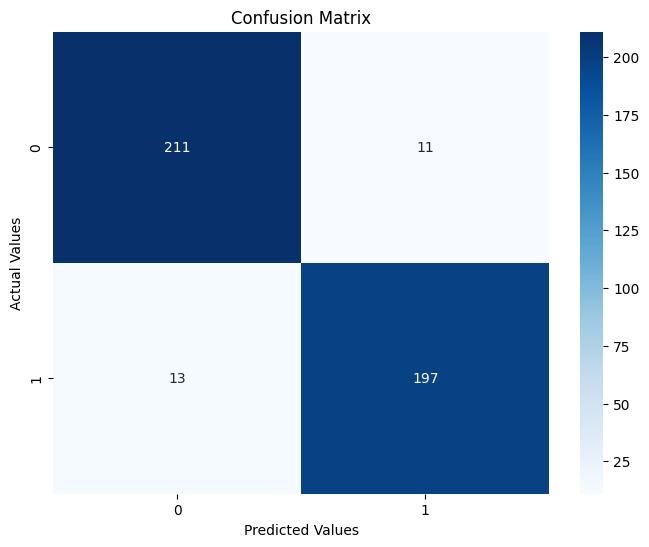

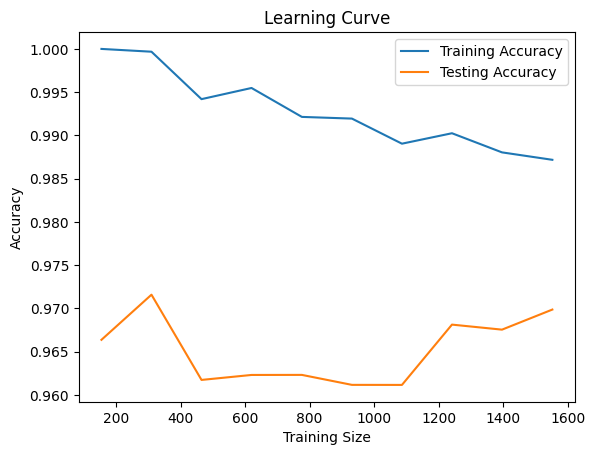

In [18]:
X_reshaped = X_scaled.reshape((X_scaled.shape[0], 1, X_scaled.shape[1]))
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
lstm_model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2]),
                         kernel_regularizer=regularizers.l2(0.01)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

lstm_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
lstm_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

lstm_features = lstm_model.predict(X_train)
print(lstm_features)
print("LSTM FEATURES: ", lstm_features.shape)

rf_classifier_lstm = RandomForestClassifier(n_estimators=100, oob_score=True,random_state=42, max_depth=5)
rf_classifier_lstm.fit(lstm_features, y_train)

lstm_test_features = lstm_model.predict(X_test)
y_pred_rf = rf_classifier_lstm.predict(lstm_test_features)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Hybrid Model Accuracy:", accuracy_rf)

lstma_test_features = lstm_model.predict(X_train)
ya_pred_rf = rf_classifier_lstm.predict(lstma_test_features)
accuracy_rf = accuracy_score(y_train, ya_pred_rf)
print("Hybrid Model Accuracy:", accuracy_rf)

print(classification_report(y_test, y_pred_rf))

cm = confusion_matrix(y_test, y_pred_rf)

print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

train_sizes, train_scores, test_scores = learning_curve(rf_classifier_lstm, lstm_features, y_train, cv=10, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.show()


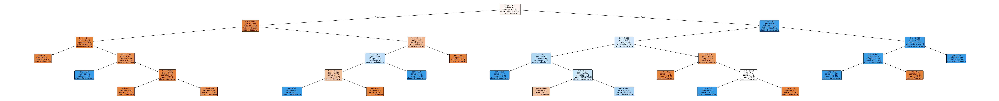

In [18]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

estimator = rf_classifier_lstm.estimators_[0] 

plt.figure(figsize=(100,10))  
plot_tree(estimator, 
          feature_names=X.columns,  
          class_names=['Goodware', 'Ransomware'], 
          filled=True, 
          rounded=True, 
          fontsize=10) 
plt.show()

In [19]:
with open('dxwebsetup.exe', 'rb') as f:
    bytes_data = f.read(1024)

decimal_values = list(struct.unpack('B' * len(bytes_data), bytes_data))

X_new = np.array(decimal_values).reshape(1, -1)

X_lstm = scaler.transform(X_new) 
print(X_lstm)
#X_pca_new = pca.transform(X_scaled)

X_lstm_new = X_lstm.reshape((X_lstm.shape[0], 1, X_lstm.shape[1]))

lstm_features_new = lstm_model.predict(X_lstm_new)
print(lstm_features_new)
predict_new = rf_classifier_lstm.predict(lstm_features_new)

print(predict_new)

[[ 0.          0.          0.15606652 ... -0.14603367 -0.13200915
  -0.19352849]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
[[0.9495892]]
[1]


d:\Code\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [20]:
joblib.dump(rf_classifier_lstm, 'rf_lstm.pkl')
lstm_model.save('lstm_model.keras')

9. Pengujian Random Forest dengan LSTM dan PCA

Epoch 1/10


d:\Code\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7340 - loss: 2.5400 - val_accuracy: 0.9051 - val_loss: 0.9615
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9445 - loss: 0.7461 - val_accuracy: 0.9329 - val_loss: 0.4506
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9582 - loss: 0.3795 - val_accuracy: 0.9421 - val_loss: 0.3307
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9601 - loss: 0.2832 - val_accuracy: 0.9398 - val_loss: 0.2911
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9585 - loss: 0.2442 - val_accuracy: 0.9444 - val_loss: 0.2733
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9566 - loss: 0.2233 - val_accuracy: 0.9468 - val_loss: 0.2640
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9572 - loss: 0.2101 - val_accuracy: 0.9444 - val_loss: 0.2586
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9587 - loss: 0.2004 - val_accuracy: 0.9468 - val_loss: 0.2544
E

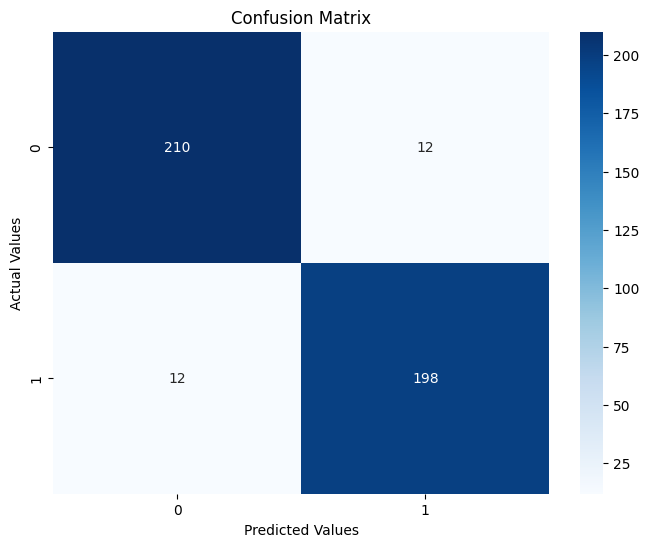

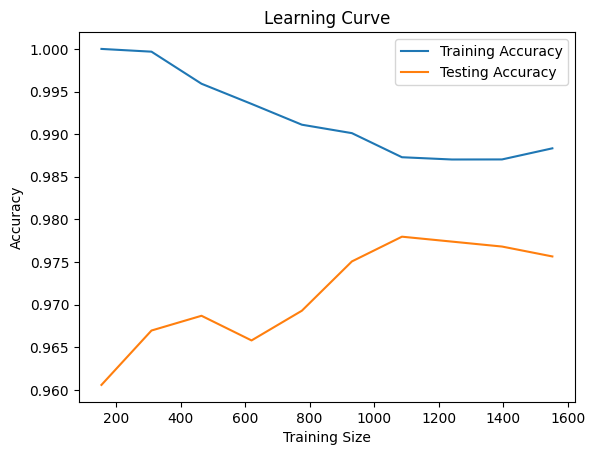

In [12]:
#Dimensionality Reduction dengan PCA
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

X_reshaped = X_pca.reshape((X_pca.shape[0], 1, X_pca.shape[1]))
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
lstm_model_pca = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2]),
                         kernel_regularizer=regularizers.l2(0.01)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

lstm_model_pca.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
lstm_model_pca.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

lstm_features = lstm_model_pca.predict(X_train)
print(lstm_features)
print("LSTM FEATURES: ", lstm_features.shape)


rf_classifier_lstm_pca = RandomForestClassifier(n_estimators=100, oob_score=True,random_state=42, max_depth=5)
rf_classifier_lstm_pca.fit(lstm_features, y_train)

lstm_test_features = lstm_model_pca.predict(X_test)
y_pred_rf = rf_classifier_lstm_pca.predict(lstm_test_features)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Hybrid Model Accuracy:", accuracy_rf)

lstma_test_features = lstm_model_pca.predict(X_train)
ya_pred_rf = rf_classifier_lstm_pca.predict(lstma_test_features)
accuracy_rf = accuracy_score(y_train, ya_pred_rf)
print("Hybrid Model Accuracy:", accuracy_rf)

print(classification_report(y_test, y_pred_rf))

cm = confusion_matrix(y_test, y_pred_rf)

print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

train_sizes, train_scores, test_scores = learning_curve(rf_classifier_lstm_pca, lstm_features, y_train, cv=10, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.show()

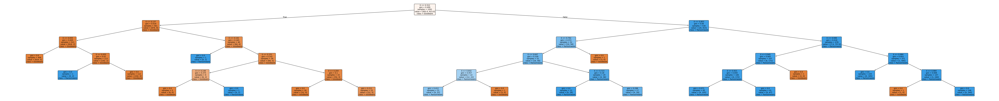

In [22]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

estimator = rf_classifier_lstm_pca.estimators_[0] 

plt.figure(figsize=(100,10))  
plot_tree(estimator, 
          feature_names=X.columns,  
          class_names=['Goodware', 'Ransomware'], 
          filled=True, 
          rounded=True, 
          fontsize=10) 
plt.show()

In [31]:
with open('goodware/DroidCamApp.exe', 'rb') as f:
    bytes_data = f.read(1024)

decimal_values = list(struct.unpack('B' * len(bytes_data), bytes_data))

X_new = np.array(decimal_values).reshape(1, -1)
print("1. Data awal: ",X_new)
print("Ukuran:",X_new.shape)

X_lstm_pca_new = scaler.transform(X_new) 
X_lstm_pca_new
print("2. Setelah Scaling: ",X_lstm_pca_new)
print("Ukuran:",X_lstm_pca_new.shape)

X_pca_new = pca.transform(X_lstm_pca_new)
print("3. Setelah PCA: ",X_pca_new)
print("Ukuran:",X_pca_new.shape)
X_lstm_new = X_pca_new.reshape((X_pca_new.shape[0], 1, X_pca_new.shape[1]))

lstm_features_new = lstm_model_pca.predict(X_lstm_new)
print("3. Setelah PCA dan LSTM: ",lstm_features_new)
predict_new = rf_classifier_lstm_pca.predict(lstm_features_new)

print("4. Hasil Prediksi: ",predict_new)
print("Ukuran:",X_lstm_pca_new.shape)

1. Data awal:  [[ 77  90 144 ...   0   0   0]]
Ukuran: (1, 1024)
2. Setelah Scaling:  [[ 0.          0.          0.15606652 ... -0.14603367 -0.13200915
  -0.19352849]]
Ukuran: (1, 1024)
3. Setelah PCA:  [[ -0.52270772  -7.94273964  -6.37182507   9.32579807   0.59853377
    2.39389681   4.30058859   2.44779633  -8.68913516  10.26429672
    4.86218769  -1.54884192   0.23978011  -1.24526094  -3.0829469
    4.87428449   2.8247183   -0.27299025  10.60019922   4.20360161
    9.1250442   15.72825814  -0.23778561   1.65975084  -2.68207343
   -2.18163975   8.38067564   6.16778386  -5.1785202   -5.99856458
   -3.84965265  -0.56721181  -3.54411661   1.52421349  -4.41359291
    2.970326    -1.41941168  -3.99479905  -0.71533913   2.70830675
  -12.88235494   0.09767901   2.99491617  -1.21633842   7.67873458
   -1.91154181  -5.06407933   5.36544095   3.53128281  -5.48466772
    0.64624748   4.0226783   -1.25669908  -0.78547142  -2.98828799
    2.05426674   1.04732855   2.69483448  -2.29875945   1.284

d:\Code\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


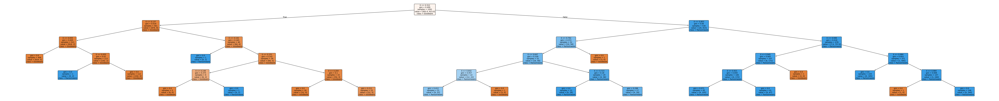

In [30]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

estimator = rf_classifier_lstm_pca.estimators_[0] 

plt.figure(figsize=(100,10))  
plot_tree(estimator, 
          feature_names=X.columns,  
          class_names=['Goodware', 'Ransomware'], 
          filled=True, 
          rounded=True, 
          fontsize=10) 
plt.show()

In [24]:
joblib.dump(rf_classifier_lstm_pca, 'rf_lstm_pca.pkl')
lstm_model_pca.save('lstm_pca_model.keras')